# CS436: Computer Vision Fundamentals - Project Phase / Week 3
## 3D Scene Reconstruction and Virtual Tour

#### Name: Syed Muhammad Ashhar Shah
#### Roll Number: 25-03-0009
#### Program: MS-CS

# PHASE 3 (29th November 2025)
---

### Tasks Completed In This Phase

- **Essential Matrix Estimation**

- **Pose Recovery & Disambiguation**

- **Point Cloud Generation**

## Define Imports
- The required libraries for the code are imported here.

In [1]:
import os
import cv2
import numpy as np
from natsort import natsorted
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from scipy.optimize import least_squares
from scipy.sparse import lil_matrix, csr_matrix
from numba import njit, prange

## Configure Variables
- The variables that are to be used throughout the code are specified here.
    - output_dir = The directory that contains the pre-processed images
    - resized_paths = A list to store the full path of the images
    - images = A list to read each image and store it
    - features = Dictionary that contains SIFT keypoints for each image path
    - descriptors = Dictionary that contains SIFT descriptors for each image path
    - camera_poses = Dictionary that contains the rotation (R) and translation (t) matrices of each camera
    - point_cloud = A global 3D map (initially empty)
    - map_3d_to_keypoint_indices =  A list for each 3D point, track which image keypoints created it

In [2]:
output_dir = r"../Tehzeeb_v2/resized_images"
resized_paths = []
images = []

features = {}           # Stores keypoints (kp) for each image file
descriptors = {}        # Stores descriptors (desc) for each image file
camera_poses = {}       # Stores (R, t) for each image file
point_cloud = np.empty((0, 3), dtype=np.float64) # The 3D map
map_3d_to_keypoint_indices = []

## Fetch Resized Images

#### Fetch Resized Paths

In [3]:
# fetch the final paths of all the resized images
for f in os.listdir(output_dir):
    ext = os.path.splitext(f)[1]
    if (ext == ".jpg"):
        full_path = os.path.join(output_dir, f)
        resized_paths.append(full_path)
        print(f"Found File: {full_path}")

# sort the paths according to the file names
resized_paths = natsorted(resized_paths)

Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112559.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112547.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112453.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112528.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112604.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112557.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112507.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112524.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112512.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112601.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112446.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112603.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112518.jpg
Found File: ../Tehzeeb_v2/resized_images/IMG_20251112_112551.jpg
Found File: ../Tehzeeb_v2

#### Open & Store Each Images

In [4]:
# open each image path and store the resultant images in a list
for img_path in resized_paths:
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)

#### Display The Captured Images


Displaying the captured images...


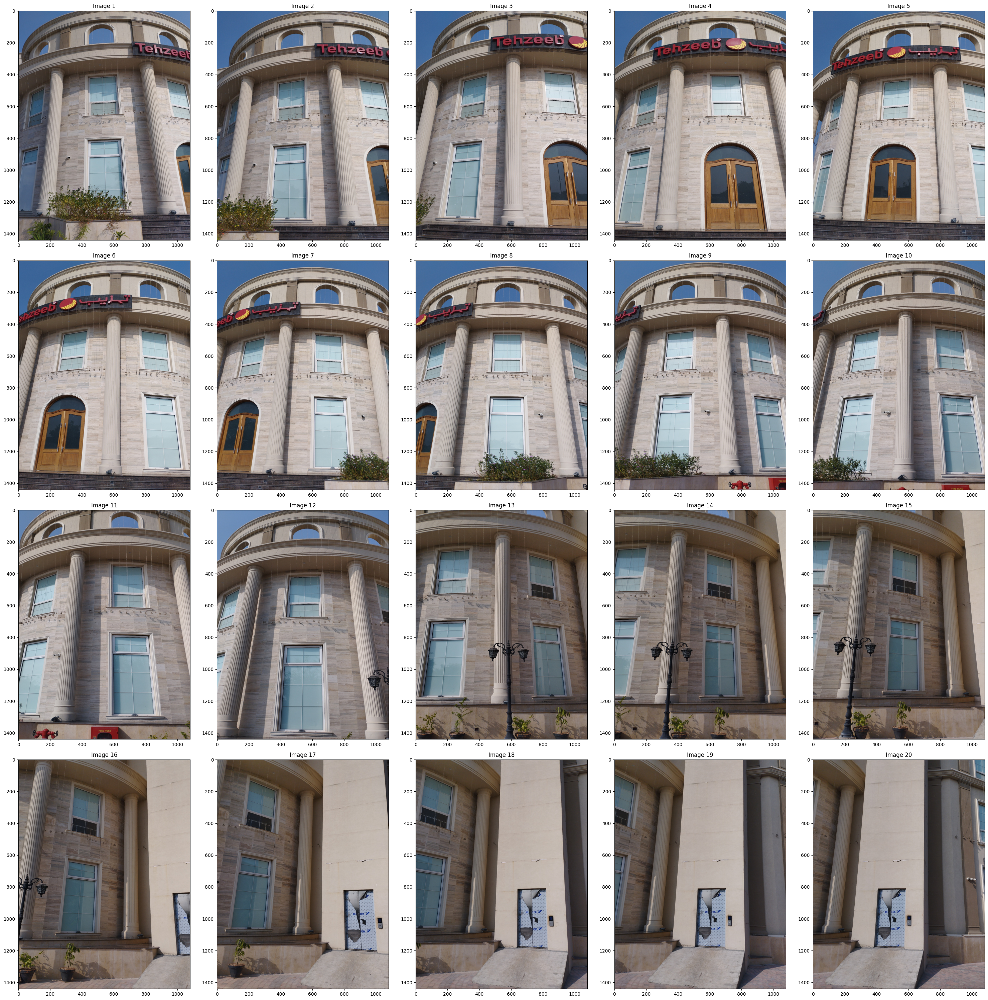

In [5]:
# function to show the images
print(f"\nDisplaying the captured images...")

# define grid-like formatting
rows = 4
cols = 5
fig, axes = plt.subplots(rows, cols, figsize=(30, 30))
axes = axes.flatten()

# loop over and display each image
for i, ax in enumerate(axes):
    ax.imshow(images[i])
    ax.set_title(f"Image {i+1}")

plt.tight_layout()
plt.show()

## Compute Features & Perform Feature Matching Between Two Consecutive Images
- Compute features between the two images using OpenCV's SIFT feature detector
- Detect matches between two images using OpenCV's FLANN feature matches detector
- Apply lowes ratio test between the two matches to further filter good matches
- Display a subset of the matched images with the match lines in between

#### Function To Compute Features (Keypoints & Descriptors)

In [6]:
def compute_features(image):
    gray_scaled = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Increase nfeatures to allow SIFT to detect more keypoints
    sift = cv2.SIFT_create(
        nfeatures=10000,      # default is only 0 → auto, but tends to stay low
        contrastThreshold=0.01,   # lower → detect more keypoints
        edgeThreshold=5,      # lower → more keypoints near edges
        sigma=1.2             # slightly higher blur → more stable keypoints
    )

    keypoints, descriptors = sift.detectAndCompute(gray_scaled, None)
    return keypoints, descriptors

#### Function To Compute Matches Between Two Images (Uses Lowes Ratio Test)

In [7]:
def compute_matches(descriptor1, descriptor2, ratio=0.65):
    # matcher configurations
    index_params = dict(algorithm=1, trees=5)
    search_params = dict(checks=50)
    # initialize matcher
    flann_matcher = cv2.FlannBasedMatcher(index_params, search_params)
    # identify matches
    matches_found = flann_matcher.knnMatch(descriptor1, descriptor2, k=2)
    # apply lowes ratio test using ratio threshold
    final_matches = []
    for m, n in matches_found:
        if m.distance < ratio * n.distance:
            final_matches.append(m)
    return final_matches

Found 534 Matches B/W Image 1 & Image 2


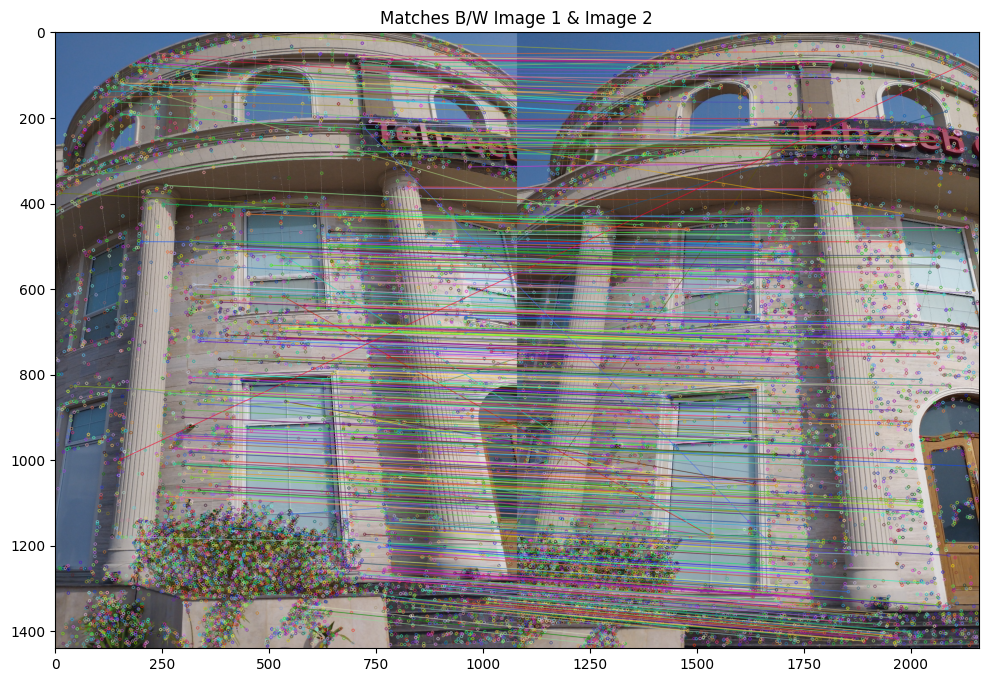

In [8]:
# fetch features for the current image and the next image
kp1, desc1 = compute_features(images[0])
kp2, desc2 = compute_features(images[1])

# find feature matching between the two images
matches = compute_matches(desc1, desc2)
    
print(f"Found {len(matches)} Matches B/W Image 1 & Image 2")
    
# draw the matches and send store the image with matches
matches_visualized = cv2.drawMatches(images[0], kp1, images[1], kp2, matches, None)
    
# display the image
plt.figure(figsize=(20, 8))
plt.imshow(matches_visualized)
plt.title(f"Matches B/W Image 1 & Image 2")
plt.show()
print("\n\n\n")

# Camera Intrinsic & Extrinsic Params

In [9]:
# Fetch The First Image In The Images Array
img_sample = images[0]

print(f"Image Shape: {img_sample.shape}\n")

# Fetch The Image Width & Height
h, w = img_sample.shape[:2]

print(f"Height Of The Image: {h}")
print(f"Width Of The Image: {w}\n")

# Create The Intrinsic Matrix
K = np.array([[w, 0, w/2],
              [0, w, h/2],
              [0, 0, 1]], dtype=np.float64)

print(f"Intrinsic Matrix:\n {K}")

Image Shape: (1440, 1080, 3)

Height Of The Image: 1440
Width Of The Image: 1080

Intrinsic Matrix:
 [[1.08e+03 0.00e+00 5.40e+02]
 [0.00e+00 1.08e+03 7.20e+02]
 [0.00e+00 0.00e+00 1.00e+00]]


# Detect & Store Features (Keypoints & Descriptors)

In [10]:
# Iterate Over The First Two Images
for i, img in enumerate(images):
    print(f"Detecting Features For: {resized_paths[i]}")
    # For Each Image Compute Its Features
    kp, desc = compute_features(img)
    print(f"Features Detected: {len(kp)}")
    # Store In Dictionary For Later Use
    features[resized_paths[i]] = kp
    descriptors[resized_paths[i]] = desc

Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112446.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112453.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112501.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112507.jpg
Features Detected: 10001
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112512.jpg
Features Detected: 10002
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112518.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112524.jpg
Features Detected: 10000
Detecting Features For: ../Tehzeeb_v2/resized_images/IMG_20251112_112528.jpg
Featu

In [11]:
print(features.keys())

dict_keys(['../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112446.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112453.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112501.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112507.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112512.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112518.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112524.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112528.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112534.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112541.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112547.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112551.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112554.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112557.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112559.jpg', '../Tehzeeb_v2/resized_images/IMG_202

In [12]:
print(descriptors.keys())

dict_keys(['../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112446.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112453.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112501.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112507.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112512.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112518.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112524.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112528.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112534.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112541.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112547.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112551.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112554.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112557.jpg', '../Tehzeeb_v2/resized_images/IMG_20251112_112559.jpg', '../Tehzeeb_v2/resized_images/IMG_202

# Align The Keypoints Between The Two Images

In [13]:
# Fetch The Keys For The First Two Images
img1_file, img2_file = resized_paths[0], resized_paths[1]

In [14]:
# Fetch The Keypoints & Descriptors For The First Two Images
kp1, desc1 = features[img1_file], descriptors[img1_file]
kp2, desc2 = features[img2_file], descriptors[img2_file]

In [15]:
# Compute The Matches Between The Two Images
matches = compute_matches(desc1, desc2)
print(f"Found {len(matches)} robust matches between Image 1 & Image 2")

Found 543 robust matches between Image 1 & Image 2


## Function To Align The Points Using The Fetched Matches

In [16]:
def get_aligned_points(kp1, kp2, matches):
    # Lists To Collect The Indexes Of Matched Keypoints
    img1idx = []
    img2idx = []
    # Iterate Over All The Matches
    for m in matches:
        # For Each Match Fetch & Store The Corresponding Match Points Between The Two Images
        img1idx.append(m.queryIdx)
        img2idx.append(m.trainIdx)
    # Convert To Numpy Arrays
    img1idx = np.array(img1idx)
    img2idx = np.array(img2idx)
    
    # List To Store The Actual x & y Coordinates
    pts1 = []
    pts2 = []
    for i in range(len(img1idx)):
        idx1 = img1idx[i]
        idx2 = img2idx[i]
        # For Each Matched Index, Fetch & Store The Corresponding Points
        pts1.append(kp1[idx1].pt)
        pts2.append(kp2[idx2].pt)
    # COnver To Numpy Arrays
    pts1 = np.array(pts1)
    pts2 = np.array(pts2)
    
    return pts1, pts2, img1idx, img2idx

In [17]:
# Using The Matches & The Overall Key Points Between The Two Images, Filter Those Keypoints That Were Used In The Matches
pts1, pts2, idx1, idx2 = get_aligned_points(kp1, kp2, matches)

# Display For Validation
print(f"Point Matches In Image 1: {pts1.shape}")
print(f"Point Matches In Image 2: {pts2.shape}")
print(f"The Point {pts1[0]} In Image 1 Is The Point {pts2[0]} In Image 2")

Point Matches In Image 1: (543, 2)
Point Matches In Image 2: (543, 2)
The Point [  4.06150007 337.98587036] In Image 1 Is The Point [217.17729187 241.88101196] In Image 2


In [18]:
# Convert Each Point Into A List & Store In A List (List Of Lists), Type Used By cv2.findEssentialMat Function
pts1_cv = pts1.astype(np.float64).reshape(-1,1,2)
pts2_cv = pts2.astype(np.float64).reshape(-1,1,2)

# Display For Validation
print(f"Point Matches In Image 1: {pts1_cv.shape}")
print(f"Point Matches In Image 2: {pts2_cv.shape}")
print(f"The Point {pts1_cv[0]} In Image 1 Is The Point {pts2_cv[0]} In Image 2")

Point Matches In Image 1: (543, 1, 2)
Point Matches In Image 2: (543, 1, 2)
The Point [[  4.06150007 337.98587036]] In Image 1 Is The Point [[217.17729187 241.88101196]] In Image 2


# Find The Essential Matrix
Use The Cv2 Library: https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html#ga0b166d41926a7793ab1c351dbaa9ffd4

Solve the equation to fetch the essential matrix that contains the Rotation (R) & Translation (t) matrices. The essential matrix related the two 2D points between the images using the formula **P2 x E x P1 = 0**.

Where:
- P1 = normalized coordinates of a point in image 1
- P2 = normalized coordinates of the corresponding point in image 2
- E = Essential Matrix (3×3)

In [19]:
# Fetch The Essential Matrix (E) & The Inliner Coorespondences (mask)
E, mask = cv2.findEssentialMat(pts1_cv, pts2_cv, K, method=cv2.RANSAC, prob=0.99, threshold=2.0)

In [20]:
# Display For Validation
print(f"Essential Matrix:\n {E}")

Essential Matrix:
 [[ 0.00403854 -0.07276905 -0.0069663 ]
 [ 0.14460357  0.02689178 -0.6916232 ]
 [-0.02918565  0.70241289  0.02069183]]


# Recover Pose
The Essential Matrix contains the Rotation (R) and the Translation (t) between the two cameras and is related through the equation **E = t x R**. Using this relation, we can fetch the relative camera pose (R, t) between the two views and find out the position of the camera in the next image.

To recover the R & t matrices from the E matrix, we can use the cv2.recoverPose function: https://docs.opencv.org/3.4/d9/d0c/group__calib3d.html#gadb7d2dfcc184c1d2f496d8639f4371c0

In [21]:
# Fetch The Rotation & Translation Matrices
_, R, t, mask_pose = cv2.recoverPose(E, pts1_cv, pts2_cv, K, mask=mask)

In [22]:
# Display For Validation
print(f"Rotation Matrix:\n {R}")
print(f"Translation Vector:\n {t}")
print(f"Inliner Points: {len(mask_pose)}")

Rotation Matrix:
 [[ 0.99356338  0.04519712  0.10387027]
 [-0.04841792  0.99841483  0.02869734]
 [-0.10240858 -0.03354181  0.99417676]]
Translation Vector:
 [[-0.99462538]
 [ 0.00692754]
 [-0.1033071 ]]
Inliner Points: 543


# Filter Points Used To Create The Pose
When we estimate the camera pose using the Essential Matrix, OpenCV returns a mask (mask_pose) indicating which point correspondences are inliers and which are outliers. Only the inliers contribute to a reliable pose, so we must filter out the points that were rejected by the algorithm.

In [23]:
# Flatten the mask_pose into a 1D boolean array
mask_inliers = mask_pose.ravel() == 1
print(f"Sample Mask Inliners (5 Points): {mask_inliers[:5]}")

# Initialize lists to store only the inlier correspondences
pts1_inliers = []
pts2_inliers = []
idx1_inliers = []
idx2_inliers = []

# Iterate over each point in the mask_pose array
for i in range(len(mask_inliers)):
    # Store the indexes & the cooridnates of only the inliner points
    if mask_inliers[i]:
        pts1_inliers.append(pts1[i])
        pts2_inliers.append(pts2[i])
        idx1_inliers.append(idx1[i])
        idx2_inliers.append(idx2[i])
        
# Convert To Numpy Arrays
pts1_inliers = np.array(pts1_inliers)
pts2_inliers = np.array(pts2_inliers)
idx1_inliers = np.array(idx1_inliers)
idx2_inliers = np.array(idx2_inliers)

# Display For Validation
print(f"Sucessful Inliner Points: {len(pts1_inliers)}")

Sample Mask Inliners (5 Points): [False  True False  True False]
Sucessful Inliner Points: 447


# Initialize The Camera Poses
Create a dictionary to store the camera poses that we can later use for visualization to display the position of each camera that is used to create the 3D point cloud.

In [24]:
# Create A Dictionary That Stores The Rotation & Translation Matrices For Each Image Path
camera_poses = {img1_file: (np.eye(3), np.zeros((3,1))), img2_file: (R, t)}

# Perform Tirangulation
Take the two corresponding 2D points (pts1, pts2) from two camera views and computing their 3D position in space. Use the cv2.triangulatePoints() function: https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html#gad3fc9a0c82b08df034234979960b778c

In [25]:
def triangulate_points(K, R1, t1, R2, t2, pts1, pts2, min_angle_deg):
    
    # Normalize the Image Points (Convert to Camera Coordinates) = (x, y) = (x, y, 1)
    pts1_h = cv2.convertPointsToHomogeneous(pts1)[:, 0, :]
    pts2_h = cv2.convertPointsToHomogeneous(pts2)[:, 0, :]
    pts1_norm = cv2.convertPointsFromHomogeneous((np.linalg.inv(K) @ pts1_h.T).T)[:, 0, :]
    pts2_norm = cv2.convertPointsFromHomogeneous((np.linalg.inv(K) @ pts2_h.T).T)[:, 0, :]
    
    # Build the Project Matrices for both images P=[R∣t]
    P1 = np.hstack((R1, t1))
    P2 = np.hstack((R2, t2))
    
    # Perform Triangulation & Get A 4xN array of reconstructed points in homogeneous coordinates
    pts4d = cv2.triangulatePoints(P1, P2, pts1_norm.T, pts2_norm.T)
    # Convert the 4xN Homogenous Points to 3xN Non-Homogenous Points
    pts3d = cv2.convertPointsFromHomogeneous(pts4d.T)[:, 0, :]

    # Compute the camera centers where C1 = Camera 1 Centre & C2 = Camera 2 Centre
    C1 = -R1.T @ t1
    C2 = -R2.T @ t2
    
    # Create rays from camera the centers to the triangulated points
    ray1 = pts3d - C1.T
    ray2 = pts3d - C2.T
    
    # Normalize The Ray Vectors
    ray1_norm = ray1 / np.linalg.norm(ray1, axis=1)[:, np.newaxis]
    ray2_norm = ray2 / np.linalg.norm(ray2, axis=1)[:, np.newaxis]

    # Compute the (triangulation) angle between the two rays
    cos_angle = np.sum(ray1_norm * ray2_norm, axis=1)
    cos_angle = np.clip(cos_angle, -1.0, 1.0)
    angle_degrees = np.degrees(np.arccos(cos_angle))

    # Apply The Minimum Angle Threshold
    # If two cameras see the point from almost the same direction, the triangulation is very unstable
    angle_mask = angle_degrees > min_angle_deg
    
    return pts3d, angle_mask

In [26]:
# Fetch The 3D Point Cloud & The Angle Mask
point_cloud_unfiltered, angle_mask = triangulate_points(K, np.eye(3), np.zeros((3,1)), R, t, pts1_inliers, pts2_inliers, min_angle_deg=3.0)

In [27]:
# Apply the Angle Mask To Filter Out Unstable Points
point_cloud = point_cloud_unfiltered[angle_mask]
print(f"Phase 1 complete. Initial 3D map size: {len(point_cloud)}")

Phase 1 complete. Initial 3D map size: 447


In [28]:
idx1_initial = idx1_inliers[angle_mask]
idx2_initial = idx2_inliers[angle_mask]

# Initialize map manager structure
for i in range(len(point_cloud)):
    map_3d_to_keypoint_indices.append({
        img1_file: idx1_initial[i],
        img2_file: idx2_initial[i]
    })
print(f"Phase 1 complete. Initial 3D map size: {len(point_cloud)}")

Phase 1 complete. Initial 3D map size: 447


In [29]:
for map_3d_idx, map_entry in enumerate(map_3d_to_keypoint_indices[:10]):
    print(f"{map_3d_idx} = {map_entry}")

0 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 48, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 527}
1 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 63, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 585}
2 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 100, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 254}
3 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 121, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 377}
4 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 125, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 1498}
5 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 150, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 1616}
6 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 156, '../Tehzeeb_v2/resized_images/IMG_20251112_112440.jpg': 1670}
7 = {'../Tehzeeb_v2/resized_images/IMG_20251112_112433.jpg': 163, '../Tehzeeb_v2/resized_images/IMG_20251112_1

# Bundle Adjustment Functions
Below are the helper functions that are used for the bundle adjustment for the camera positions and the 3D point cloud.

## Convert batch of rotation vectors (Rodrigues vectors) into their corresponding 3×3 rotation matrices
- This is a batched implementation of OpenCV’s cv2.Rodrigues, but vectorized in a loop and JIT-compiled by Numba.
- A Rodrigues vector rvec = (rx, ry, rz) encodes a rotation in 3D:
    - Direction = rotation axis
    - Magnitude = rotation angle (in radians)
- This function converts them into rotation matrices, which are easier/faster to use during projection.

In [30]:
@njit
def _rodrigues_batch_numba(rvecs):
    # fetch the number of rotation vectors
    n = rvecs.shape[0]
    R_out = np.empty((n, 3, 3), dtype=np.float32)
    
    # create the rotation matrices & append to the R_out list
    for i in range(n):
        rx, ry, rz = rvecs[i]
        theta2 = rx*rx + ry*ry + rz*rz

        if theta2 > 1e-12:
            theta = np.sqrt(theta2)
            kx, ky, kz = rx/theta, ry/theta, rz/theta
            c, s = np.cos(theta), np.sin(theta)
            v = 1.0 - c

            R_out[i, 0, 0] = kx*kx*v + c
            R_out[i, 0, 1] = kx*ky*v - kz*s
            R_out[i, 0, 2] = kx*kz*v + ky*s

            R_out[i, 1, 0] = ky*kx*v + kz*s
            R_out[i, 1, 1] = ky*ky*v + c
            R_out[i, 1, 2] = ky*kz*v - kx*s

            R_out[i, 2, 0] = kz*kx*v - ky*s
            R_out[i, 2, 1] = kz*ky*v + kx*s
            R_out[i, 2, 2] = kz*kz*v + c
        else:
            # Near-zero rotation = identity
            R_out[i] = np.eye(3, dtype=np.float32)

    return R_out

## Numba-accelerated projection of 3D points into 2D camera coordinates
- Projects 3D points (pts) into 2D pixel coordinates.
- Uses precomputed rotation (R_all) and translation (t_all) for each camera.
- Uses camera intrinsics: fx, fy (focal lengths), cx, cy (principal point offsets).
- Returns (N, 2) array of pixel coordinates.

In [31]:
@njit(parallel=True)
def _project_numba(R_all, t_all, pts, cam_indices, fx, fy, cx, cy):
    
    n = pts.shape[0]
    
    # pre-allocate the 2D pixel coordinates for all points
    out = np.empty((n, 2), dtype=np.float32)
    
    # loop over all the points
    for i in prange(n):
        # fetch the camera for each point
        c = cam_indices[i]
        # for the camera select its Rotation & Translation Vector
        R = R_all[c]
        t0, t1, t2 = t_all[c]
        # fetch the 3D coordinates
        X, Y, Z = pts[i]

        # apply the extrinsic transformation [R | t] * X
        xc = R[0,0]*X + R[0,1]*Y + R[0,2]*Z + t0
        yc = R[1,0]*X + R[1,1]*Y + R[1,2]*Z + t1
        zc = R[2,0]*X + R[2,1]*Y + R[2,2]*Z + t2
        # fail safe to prevent division by zero / infinity depth issue
        if zc == 0:
            zc = 1e-8
            
        # apply the pinhole camera model (projection) / project the 3D points into 2D pixel coordinate
        u = fx * (xc / zc) + cx
        v = fy * (yc / zc) + cy
        # store the result
        out[i, 0], out[i, 1] = u, v
    return out

## Flatten the sparse Structure-from-Motion (SfM) structure into arrays
- In SfM, we have:
    - 3D points in space (point_cloud)
    - Cameras with poses (camera_poses)
    - Keypoints detected in images (features)
    - A mapping of which keypoint observes which 3D point (kp_mapping)

This function converts all of that into flat arrays of observations, i.e., for every 2D keypoint, which camera and which 3D point it corresponds to, along with the 2D coordinates.

In [32]:
def build_observations(camera_poses, point_cloud, kp_mapping, features):
    # prepare the camera list and indexes
    cam_list = list(camera_poses.keys())
    cam_to_idx = {name: i for i, name in enumerate(cam_list)}
    # convert 3D points to numpy array
    pts3d = np.asarray(point_cloud, dtype=np.float32)
    
    # initialize observation arrays
    # cam_idx_list: will store camera index for each observation.
    # pt_idx_list: will store 3D point index for each observation.
    # xy_list: will store 2D coordinates of the keypoint in the image.
    cam_idx_list = []
    pt_idx_list = []
    xy_list = []
    
    # loop over each 3D point
    for pt_idx, kp_map in enumerate(kp_mapping):
        # loop over each camera observing the point
        for img, kp_id in kp_map.items():
            # skip the images that are not in our camera poses
            if img not in cam_to_idx:
                continue
            # fetch the camera index
            cam_id = cam_to_idx[img]
            # fetch the keypoint coordinates
            kp = features[img][kp_id]
            x, y = kp.pt
            # append data to observation lists
            cam_idx_list.append(cam_id)
            pt_idx_list.append(pt_idx)
            xy_list.append([x, y])
            
    return (
        cam_list,
        cam_to_idx,
        pts3d,
        np.array(cam_idx_list, dtype=np.int32),
        np.array(pt_idx_list, dtype=np.int32),
        np.array(xy_list, dtype=np.float32),
    )

## Handle packing and unpacking camera parameters into a single vector
- pack_camera_params
    - Convert a subset of cameras’ rotation and translation vectors into a single 1D vector for optimization.
- unpack_camera_params
    - Convert the 1D optimization vector back into separate rotation (rvecs) and translation (tvecs) lists.

In [33]:
def pack_camera_params(rvecs, tvecs, opt_cam_indices):
    # initialize empty list
    params = []
    # loop over the cameras
    for i in opt_cam_indices:
        # each camera contributes 6 numbers, 3 for rotation and 3 for translation.
        params.append(np.asarray(rvecs[i], dtype=np.float32))
        params.append(np.asarray(tvecs[i], dtype=np.float32))
    # flatten everything into a 1D array, if no cameras are selected then return np.zeros(0).
    # output will be a 1D vector: [rvec0, tvec0, rvec1, tvec1, ...]
    return np.hstack(params).astype(np.float32) if params else np.zeros(0, np.float32)

def unpack_camera_params(vec, opt_cam_indices, n_cams):
    rvecs = [] # store the rotation vectors for all cameras
    tvecs = [] # store the translation vectors for all cameras
    
    # initialize the lists with zeros
    for _ in range(n_cams):
        rvecs.append(np.zeros(3, dtype=np.float32))
        tvecs.append(np.zeros(3, dtype=np.float32))

    offset = 0 # variable to keep track of where we care in the 1D vector
    
    # loop over the optimized cameras
    for cam_idx in opt_cam_indices:
        # loop over the 3 components of each vector
        for j in range(3):
            # the first 3 numbers are the rotation vectors
            rvecs[cam_idx][j] = vec[offset + j]
            # the next 3 numbers are the translation vectors
            tvecs[cam_idx][j] = vec[offset + 3 + j]
        # move offset forward by 6 (next camera params)
        offset += 6

    return rvecs, tvecs

## Build the sparsity pattern of the Jacobian for bundle adjustment
- In bundle adjustment, we optimize camera parameters and 3D points to minimize reprojection error.
- The Jacobian has partial derivatives of 2D projections w.r.t each parameter.
- Not all parameters affect all observations, most of the Jacobian is zeros.
- This creates a sparse matrix that tells the optimizer which entries are non-zero, so computations are faster.

In [34]:
def build_jac_sparsity(n_cams, n_points, cam_ids, pt_ids, opt_cam_map):
    # fetch the number of 2D observations
    obs_n = cam_ids.shape[0]
    # fetch the number of cameras that need to be optimized
    n_opt_cams = sum(v >= 0 for v in opt_cam_map.values())
    # fetch the number of variables in the optimization problem
    total_vars = 6*n_opt_cams + 3*n_points

    # initialize the sparse jacobian matrix
    # 2*obs_n = each observation gives two points (x,y)
    # total_vars = number of columns / one for each param (camera + point)
    J = lil_matrix((2*obs_n, total_vars), dtype=np.int8)

    # loop over the observations
    for o in range(obs_n):
        # fetch the camera and the point for the observation
        cam = cam_ids[o]
        pt = pt_ids[o]

        # fill the camera block (-1 if camera is not in the optimization)
        cam_order = opt_cam_map.get(cam, -1)
        if cam_order >= 0:
            # each camera has 6 params (R & t)
            off = cam_order * 6
            # both rows for this observation (x and y) are affected by all 6 camera parameters hence set to 1
            J[2*o, off:off+6] = 1
            J[2*o+1, off:off+6] = 1

        # fill the point block
        pt_off = 6*n_opt_cams + 3*pt # each point has 3 variables (X,Y,Z), columns for point pt start at 6*n_opt_cams because camera variables come first
        # both rows for this observation (x and y) are affected by all 3 point coordinates hence set to 1
        J[2*o, pt_off:pt_off+3] = 1
        J[2*o+1, pt_off:pt_off+3] = 1
    return csr_matrix(J)

## Compute the residuals (differences) between observed 2D keypoints and projected 3D points for all cameras
- Residuals are what an optimizer (like scipy.optimize.least_squares) minimizes
- residual = projected 2D points − observed 2D points

In [35]:
def gba_residuals_numba(
    x, n_cams, n_points, opt_cam_indices, opt_cam_map,
    fixed_rvecs, fixed_tvecs,
    cam_ids, pt_ids, xy_obs, K
):

    # split x into camera & point paramaters
    n_opt = len(opt_cam_indices)
    cam_block = 6*n_opt
    x_cam = x[:cam_block].astype(np.float32) # the first 6×n_opt numbers are the rotation + translation vectors of optimized cameras
    x_pts = x[cam_block:].astype(np.float32).reshape((n_points, 3)) # the remaining numbers are the 3D point coordinates

    # build the full Rotation & Translation vectors
    rvecs = [r.copy() for r in fixed_rvecs]
    tvecs = [t.copy() for t in fixed_tvecs]

    off = 0
    # iterate over each optimized camera
    for idx, cam in enumerate(opt_cam_indices):
        # take the rotation vector (3 numbers) and translation vector (3 numbers) from x_cam.
        rvecs[cam] = x_cam[off:off+3]
        tvecs[cam] = x_cam[off+3:off+6]
        off += 6
    
    # convert into arrays
    r_arr = np.stack(rvecs).astype(np.float32)
    t_arr = np.stack(tvecs).astype(np.float32)
    
    # find the rotaion matrices from the rotation arrays
    R_all = _rodrigues_batch_numba(r_arr)

    # fetch the 3D coordinates of points that are actually observed
    pts_obs = x_pts[pt_ids]
    
    # fetch the camera intrinsic params
    fx, fy = np.float32(K[0,0]), np.float32(K[1,1])
    cx, cy = np.float32(K[0,2]), np.float32(K[1,2])
    
    # fetch the 2D predicted points
    pred = _project_numba(R_all, t_arr, pts_obs, cam_ids, fx, fy, cx, cy)
    
    # compute the difference between predicted and observed 2D points (will be optimized / loss)
    return (pred - xy_obs).ravel().astype(np.float32)

## Perform global bundle adjustment on a set of cameras and 3D points
- Optimize the Camera rotations & translations
- Optimize the 3D point coordinates
- Use sparse least-squares optimization with Huber loss to reduce the effect of outliers

In [36]:
# -------------------------------------------------------
# High-level BA wrapper
# -------------------------------------------------------

def run_global_bundle_adjustment_optimized(
    camera_poses, point_cloud, kp_map, features, K,
    fix_first_camera=True, max_nfev=200
):
    # check if there are indeed any camera poses or the point cloud has any points
    if camera_poses is None or point_cloud is None:
        print("[Bundle Adjustment] Invalid input (No Camera Poses / Point Cloud), skipping...")
        return camera_poses, point_cloud

    # build the obversations, converts the SfM structure into flat arrays
    obs = build_observations(camera_poses, point_cloud, kp_map, features)
    if obs is None:
        print("[Bundle Adjustment] No observations found, skipping...")
        return camera_poses, point_cloud
    
    # break down the observations into its underlying 1D arrays
    cam_list, cam_to_idx, pts3d, cam_ids, pt_ids, xy = obs
    n_cams, n_points = len(cam_list), pts3d.shape[0]

    if xy.shape[0] == 0:
        print("[Bundle Adjustment] No matches found, skipping...")
        return camera_poses, point_cloud

    # convert the camera rotation matrices into rodrigues rotation vectors (Rx, Ry, Rz)
    # fetch the corresponding translation vectors for each camera (Tx, Ty, Tz)
    r_init, t_init = [], []
    for name in cam_list:
        R, t = camera_poses[name]
        rv, _ = cv2.Rodrigues(R)
        r_init.append(rv.astype(np.float32).ravel())
        t_init.append(t.astype(np.float32).ravel())
        
    # copy these values, will be used for cameras that are fixed (not optimized)
    fixed_r, fixed_t = [r.copy() for r in r_init], [t.copy() for t in t_init]

    # select which camera to optimize
    opt_cam_indices = list(range(n_cams))
    # fix the first camera as the reference frame
    if fix_first_camera and n_cams > 0:
        opt_cam_indices = [i for i in range(n_cams) if i != 0]
    
    # build the camera map, maps camera index against the order in the optimization vector
    opt_cam_map = {}
    order = 0
    for i in range(n_cams):
        if i in opt_cam_indices:
            opt_cam_map[i] = order
            order += 1
        else:
            # fixed cameras get -1 (first camera)
            opt_cam_map[i] = -1

    # pack the initial parameters
    x0_cam = pack_camera_params(r_init, t_init, opt_cam_indices)
    x0_pts = pts3d.ravel().astype(np.float32)
    x0 = np.hstack([x0_cam, x0_pts]).astype(np.float32)

    # build the Jacobian sparsity matrix, which tells the optimzier which enteries are non-zero
    J_pattern = build_jac_sparsity(n_cams, n_points, cam_ids, pt_ids, opt_cam_map)

    print(f"Bundle Adjustment: {n_cams} cams, {n_points} pts, {xy.shape[0]} obs")
    
    # define the residual function, callable for the optimizer
    def residual_fn(x):
        return gba_residuals_numba(
            x, n_cams, n_points, opt_cam_indices, opt_cam_map,
            fixed_r, fixed_t, cam_ids, pt_ids, xy, K
        )

    # call the optimizer
    result = least_squares(
        residual_fn, x0,
        method="trf",
        jac="2-point",
        jac_sparsity=J_pattern, # exploit the sparsity matrix
        max_nfev=max_nfev,
        loss="huber", # reduce the influence of outlier points
        ftol=1e-6,
        xtol=1e-6,
        verbose=2
    )

    print("Bundle Adjustment finished:", result.success, "|", result.message)

    # unpack the optimized parameters
    x_opt = result.x.astype(np.float32)
    cam_block = 6*len(opt_cam_indices)
    cam_opt = x_opt[:cam_block] # fetch the camera parameters
    pts_opt = x_opt[cam_block:].reshape((n_points, 3)) # fetch the 3D points

    # update the camera poses
    r_new, t_new = fixed_r.copy(), fixed_t.copy()

    off = 0
    for cam in opt_cam_indices:
        r_new[cam] = cam_opt[off:off+3]
        t_new[cam] = cam_opt[off+3:off+6]
        off += 6
    
    # convert the Rodrigues vectors back into rotation matrices
    for i, name in enumerate(cam_list):
        R, _ = cv2.Rodrigues(r_new[i].astype(np.float64))
        t = t_new[i].reshape(3,1).astype(np.float64)
        camera_poses[name] = (R, t)

    # replaced the existing point cloud with the optimized 3D points
    point_cloud[:] = pts_opt.astype(np.float32)

    return camera_poses, point_cloud

# Build The Incremental Point Cloud

In [37]:
# Iterate through images starting from the 3rd one (incremental reconstruction)
for img_idx in range(2, len(images)):

    # Current and previous image file paths
    curr_img_path = resized_paths[img_idx]
    prev_img_path = resized_paths[img_idx - 1]

    # Load keypoints and descriptors for both images
    prev_kp, prev_desc = features[prev_img_path], descriptors[prev_img_path]
    curr_kp, curr_desc = features[curr_img_path], descriptors[curr_img_path]

    # Step 1: Match features between the previous and the current image
    matches_prev_curr = compute_matches(prev_desc, curr_desc)
    print(f"Matches Found Between Image {img_idx-1} & Image {img_idx}: {len(matches_prev_curr)}")

    # If there are not enough matches, skip the image
    if len(matches_prev_curr) < 20:
        print(f"Skipping {curr_img_path}, insufficient matches ({len(matches_prev_curr)})")
        continue

    # Extract the aligned keypoint coordinates for matched pairs
    (
        prev_matched_pts,
        curr_matched_pts,
        prev_matched_idx,
        curr_matched_idx,
    ) = get_aligned_points(prev_kp, curr_kp, matches_prev_curr)

    # Arrays to store 2D-3D points used for PnP
    pnp_points_2d = []
    pnp_points_3d = []

    # Mapping from keypoint index to the existing 3D point index
    kp_to_3d_index = {}

    # Find all 3D points previously mapped to the previous image
    for point3d_idx, kp_map in enumerate(map_3d_to_keypoint_indices):
        if prev_img_path in kp_map:
            prev_kp_idx = kp_map[prev_img_path]
            kp_to_3d_index[prev_kp_idx] = point3d_idx

    # Stores indices of matches that will need triangulation
    matches_for_triangulation = []

    # Separate matches:
    #   - those linked to existing 3D points, will be used for PnP
    #   - those NOT linked, will be triangulated later
    for m_idx in range(len(matches_prev_curr)):
        kp_idx_prev = prev_matched_idx[m_idx]

        if kp_idx_prev in kp_to_3d_index:
            # This 2D match corresponds to an existing 3D point
            point3d_idx = kp_to_3d_index[kp_idx_prev]
            pnp_points_2d.append(curr_matched_pts[m_idx])
            pnp_points_3d.append(point_cloud[point3d_idx])
            # print(f"[PnP] Using existing 3D point {point3d_idx} for match {m_idx} (kp_prev={kp_idx_prev})")
        else:
            matches_for_triangulation.append(m_idx)

    # Convert PnP inputs to NumPy arrays
    pnp_points_2d = np.array(pnp_points_2d, dtype=np.float64)
    pnp_points_3d = np.array(pnp_points_3d, dtype=np.float64)

    print(f"Image {img_idx+1} ({curr_img_path}): Found {len(pnp_points_3d)} 2D-3D correspondences for PnP.")

    # Need at least 6 correspondences for stable PnP
    if len(pnp_points_3d) < 6:
        print(f"Skipping {curr_img_path}, not enough correspondences for PnP")
        continue

    # Step 3: Solve PnP → Estimate pose of current camera
    _, rvec, tvec, inliers = cv2.solvePnPRansac(
        pnp_points_3d, pnp_points_2d, K, None,
        flags=cv2.SOLVEPNP_ITERATIVE,
        confidence=0.85,
        iterationsCount=5_000_000,
        reprojectionError=15.0
    )

    R_curr, _ = cv2.Rodrigues(rvec)
    t_curr = tvec
    camera_poses[curr_img_path] = (R_curr, t_curr)

    try:
        print(f"PnP successful for {curr_img_path}. Inliers: {len(inliers)}")
    except:
        print(f"PnP failed for {curr_img_path}")
        continue

    # Retrieve previous camera pose
    R_prev, t_prev = camera_poses[prev_img_path]

    # Extract matches that require new 3D triangulation
    prev_pts_new = prev_matched_pts[matches_for_triangulation]
    curr_pts_new = curr_matched_pts[matches_for_triangulation]
    prev_kp_idx_new = prev_matched_idx[matches_for_triangulation]
    curr_kp_idx_new = curr_matched_idx[matches_for_triangulation]

    if len(prev_pts_new) > 0:
        # Step 4: Triangulate new points
        new_pts3d_raw, angle_mask = triangulate_points(
            K, R_prev, t_prev, R_curr, t_curr,
            prev_pts_new, curr_pts_new,
            min_angle_deg=3.0
        )

        # Step 5: Cheirality check → points must be in front of both cameras
        pts3d_in_prev = R_prev @ new_pts3d_raw.T + t_prev
        pts3d_in_curr = R_curr @ new_pts3d_raw.T + t_curr
        cheirality_mask = (pts3d_in_prev[2, :] > 0) & (pts3d_in_curr[2, :] > 0)

        # Combine geometric angle + cheirality checks
        valid_mask = angle_mask & cheirality_mask
        new_pts3d_filtered = new_pts3d_raw[valid_mask]

        valid_prev_idx = prev_kp_idx_new[valid_mask]
        valid_curr_idx = curr_kp_idx_new[valid_mask]

        # Step 6: Insert new points into global 3D map
        if len(new_pts3d_filtered) > 0:
            point_cloud = np.vstack((point_cloud, new_pts3d_filtered))
            for k in range(len(new_pts3d_filtered)):
                map_3d_to_keypoint_indices.append({
                    prev_img_path: valid_prev_idx[k],
                    curr_img_path: valid_curr_idx[k]
                })

            print(f"Added {len(new_pts3d_filtered)} new 3D points. Total map size: {len(point_cloud)}")

        if(img_idx % 2 == 0):
            print("\nRunning Global Bundle Adjustment...")
            camera_poses, point_cloud = run_global_bundle_adjustment_optimized(
                camera_poses,
                point_cloud,
                map_3d_to_keypoint_indices,
                features,
                K
            )
            print("Finished Global Bundle Adjustment.\n")

        else:
            print("No new points passed angle + cheirality filters.")

Matches Found Between Image 1 & Image 2: 566
Image 3 (../Tehzeeb_v2/resized_images/IMG_20251112_112446.jpg): Found 134 2D-3D correspondences for PnP.
PnP successful for ../Tehzeeb_v2/resized_images/IMG_20251112_112446.jpg. Inliers: 133
Added 420 new 3D points. Total map size: 867

Running Global Bundle Adjustment...
Bundle Adjustment: 3 cams, 867 pts, 1734 obs
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         3.3764e+04                                    9.52e+05    
       1              2         3.1348e+04      2.42e+03       3.88e-03       3.68e+05    
       2              5         3.0395e+04      9.53e+02       5.00e-03       3.27e+05    
       3              6         2.9506e+04      8.89e+02       5.00e-03       4.94e+05    
       4              7         2.9027e+04      4.80e+02       1.63e-03       4.58e+05    
       5              8         2.8077e+04      9.50e+02       5.30e-03       5.90e+05    


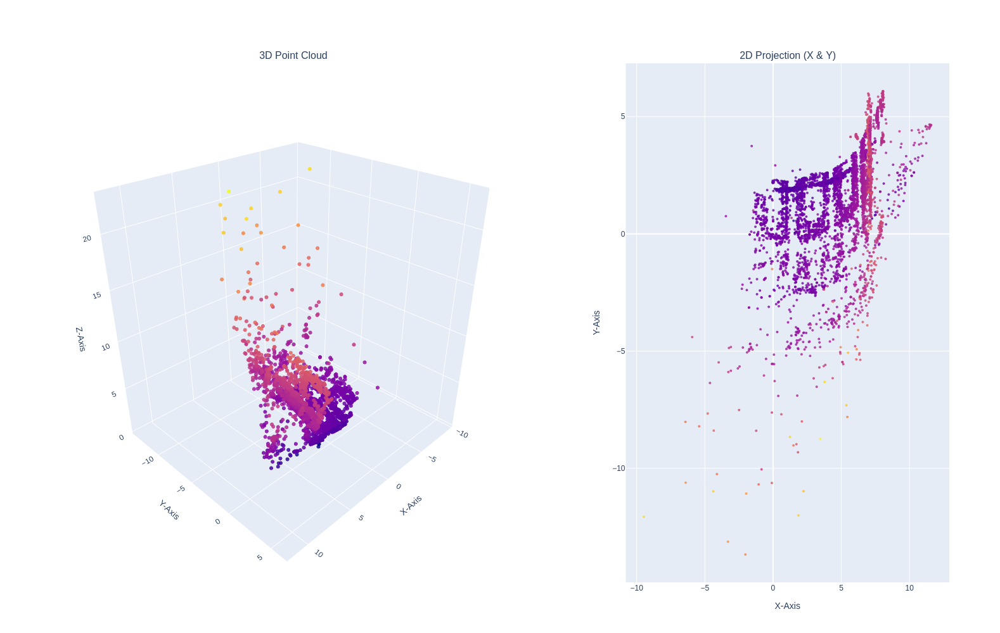

In [38]:
# Extract The XYZ Coordinates From The Point Cloud
X_coords = point_cloud[:, 0]
Y_coords = point_cloud[:, 1]
Z_coords = point_cloud[:, 2]

# Define Subplot Structure 1 Row, 2 Cols
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scene'}, {'type': 'xy'}]],
    column_widths=[0.6, 0.4],
    subplot_titles=("3D Point Cloud", "2D Projection (X & Y)")
)

# Create The 3D Scatter Plot
fig.add_trace(
    go.Scatter3d(
        x=X_coords, y=Y_coords, z=Z_coords,
        mode='markers',
        marker=dict(
            size=2,                     # slightly larger points
            color=Z_coords,             # color based on depth
            colorscale='Plasma',        # updated colormap
            opacity=0.85                # slight transparency
        )
    ),
    row=1, col=1 # Position In Grid
)

# Define Visual Parameters For The 3D View
fig.update_scenes(
    xaxis_title="X-Axis",
    yaxis_title="Y-Axis",
    zaxis_title="Z-Axis",
    aspectmode="data",             # equal aspect ratio
    camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))  # adjusted camera position
)

# Create The 2D Scatter Plot (X & Y Axis)
fig.add_trace(
    go.Scatter(
        x=X_coords, y=Y_coords,
        mode='markers',
        marker=dict(
            size=4,                     # slightly larger points
            color=Z_coords,
            colorscale='Plasma',        # updated colormap
            opacity=0.8
        )
    ),
    row=1, col=2 # Position In Grid
)

# Define Visual Parameters For 2D Plot
fig.update_xaxes(title_text="X-Axis", row=1, col=2)
fig.update_yaxes(title_text="Y-Axis", row=1, col=2)

# Define The Layout
fig.update_layout(
    height=1000,
    width=1600,
    showlegend=False,
)

fig.show()